In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [31]:
df_gk_player = pd.read_csv("Scrape_output/2014-2015-Premier-League-Stats_gk_players.csv")
df_player = pd.read_csv("Scrape_output/2014-2015-Premier-League-Stats_players.csv")
df_gk_player['minutes'] = df_gk_player['minutes'].apply(lambda x: int(str(x).replace(',','')))
df_player['minutes'] = df_player['minutes'].apply(lambda x: int(str(x).replace(',','')))

In [32]:
df_one_year = pd.merge(df_gk_player,df_player,on=['player','squad','nationality','position','age'],suffixes=['_pl','_gk'],how='outer')

In [33]:
df_one_year.head()

,Unnamed: 0_pl,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
0,0.0,38.0,19.0,90.0,0.704,eng ENG,Tom Heaton,GK,28,26.3,...,0.0,0.0,38.0,1.0,0.0,0.0,3420.0,0.0,0.0,0.0
1,1.0,38.0,15.0,89.0,0.725,es ESP,Adrián,GK,27,21.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,37.0,8.0,90.0,0.719,es ESP,David de Gea,GK,23,29.7,...,0.0,0.0,37.0,0.0,0.0,0.0,3313.0,0.0,0.0,0.0
3,3.0,37.0,13.0,89.0,0.746,pl POL,Łukasz Fabiański,GK,29,35.1,...,0.0,0.0,37.0,0.0,1.0,0.0,3308.0,0.0,0.0,0.0
4,4.0,36.0,7.0,90.0,0.714,eng ENG,Joe Hart,GK,27,38.9,...,0.0,0.0,36.0,1.0,0.0,0.0,3240.0,0.0,0.0,0.0


In [34]:
df_one_year = df_one_year.drop("Unnamed: 0_pl",axis=1)
df_one_year = df_one_year.drop("Unnamed: 0_gk",axis=1)

In [35]:
df_one_year.head()

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
0,38.0,19.0,90.0,0.704,eng ENG,Tom Heaton,GK,28,26.3,7.0,...,0.0,0.0,38.0,1.0,0.0,0.0,3420.0,0.0,0.0,0.0
1,38.0,15.0,89.0,0.725,es ESP,Adrián,GK,27,21.1,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,37.0,8.0,90.0,0.719,es ESP,David de Gea,GK,23,29.7,20.0,...,0.0,0.0,37.0,0.0,0.0,0.0,3313.0,0.0,0.0,0.0
3,37.0,13.0,89.0,0.746,pl POL,Łukasz Fabiański,GK,29,35.1,16.0,...,0.0,0.0,37.0,0.0,1.0,0.0,3308.0,0.0,0.0,0.0
4,36.0,7.0,90.0,0.714,eng ENG,Joe Hart,GK,27,38.9,22.0,...,0.0,0.0,36.0,1.0,0.0,0.0,3240.0,0.0,0.0,0.0


In [36]:
df_one_year[df_one_year['player'] == "Petr Čech"]

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
26,6.0,0.0,87.0,0.889,cz CZE,Petr Čech,GK,32,83.3,7.0,...,0.0,0.0,7.0,0.0,0.0,0.0,607.0,0.0,0.0,0.0


In [37]:
df_one_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 531 entries, 0 to 530
Data columns (total 39 columns):
games_starts_pl             45 non-null float64
losses                      45 non-null float64
minutes_per_game_pl         45 non-null float64
save_perc                   45 non-null float64
nationality                 530 non-null object
player                      531 non-null object
position                    531 non-null object
age                         531 non-null int64
clean_sheets_perc           44 non-null float64
wins                        45 non-null float64
goals_against_per90         45 non-null float64
games_subs_pl               45 non-null float64
goals_against               45 non-null float64
shots_on_target_against     45 non-null float64
games_pl                    45 non-null float64
clean_sheets                45 non-null float64
minutes_pl                  45 non-null float64
draws                       45 non-null float64
squad                       531 

In [38]:
df_one_year[['player','minutes_pl','minutes_gk']]

,player,minutes_pl,minutes_gk
0,Tom Heaton,3420.0,3420.0
1,Adrián,3392.0,NaN
2,David de Gea,3313.0,3313.0
3,Łukasz Fabiański,3308.0,3308.0
4,Joe Hart,3240.0,3240.0
5,Simon Mignolet,3225.0,3225.0
6,Julián Speroni,3204.0,3204.0
7,Robert Green,3183.0,3183.0
8,Asmir Begović,3150.0,3150.0
9,Hugo Lloris,3063.0,3063.0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a1af506d8>,
      dtype=object)

<Figure size 864x360 with 0 Axes>

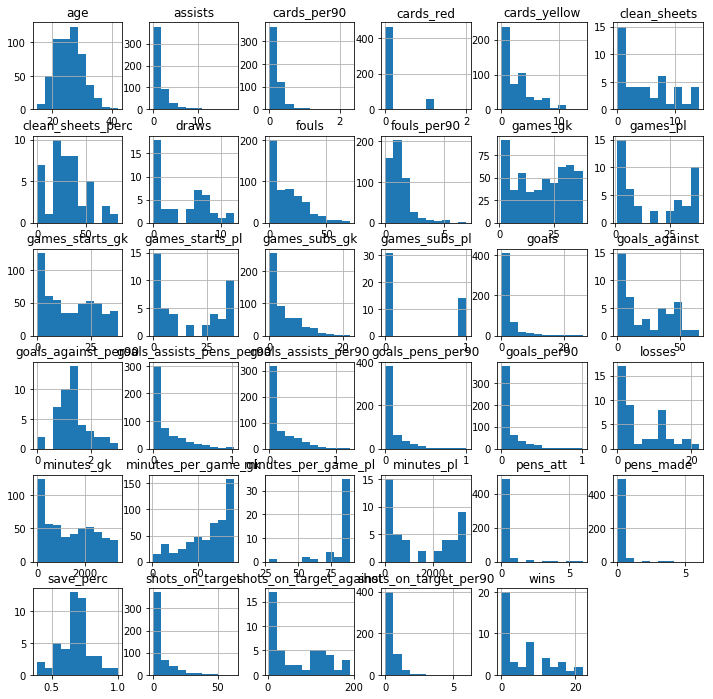

In [39]:
plt.figure(figsize=(12,5))
df_one_year.hist(figsize=(12,12))

In [41]:
df_bad_min = df_one_year[(df_one_year['minutes_pl'] != df_one_year['minutes_gk'])]
df_bad_min[(df_bad_min['minutes_gk'].notnull()) & (df_bad_min['minutes_pl'].notnull())][['player','position','nationality','squad','minutes_pl','minutes_gk']].head()

,player,position,nationality,squad,minutes_pl,minutes_gk


In [47]:
df_bad_min[df_bad_min['minutes_gk'].notnull()][['player','position','nationality','squad','minutes_pl','minutes_gk']]

,player,position,nationality,squad,minutes_pl,minutes_gk
45,Aaron Cresswell,DF,eng ENG,West Ham United,NaN,3420.0
46,John Terry,DF,eng ENG,Chelsea,NaN,3420.0
47,Branislav Ivanović,DF,rs SRB,Chelsea,NaN,3420.0
48,Ahmed Elmohamady,"DF,MF",eg EGY,Hull City,NaN,3419.0
49,Kieran Trippier,DF,eng ENG,Burnley,NaN,3415.0
50,Steven Nzonzi,MF,fr FRA,Stoke City,NaN,3374.0
51,Eden Hazard,"FW,MF",be BEL,Chelsea,NaN,3367.0
52,Jason Shackell,DF,eng ENG,Burnley,NaN,3346.0
53,Joel Ward,"MF,DF",eng ENG,Crystal Palace,NaN,3330.0
54,José Fonte,DF,pt POR,Southampton,NaN,3330.0


In [48]:
df_gk_player_95 = pd.read_csv("Scrape_output/1995-1996-Premiership-Stats_gk_players.csv")
df_player_95 = pd.read_csv("Scrape_output/1995-1996-Premiership-Stats_players.csv")

In [49]:
df_gk_player_95['minutes'] = df_gk_player_95['minutes'].apply(lambda x: int(str(x).replace(',','')))
df_player_95['minutes'] = df_player_95['minutes'].apply(lambda x: int(str(x).replace(',','')))

In [50]:
df_second_year = pd.merge(df_gk_player_95,df_player_95,on=['player','squad','nationality','position','age'],suffixes=['_pl','_gk'],how='outer')

In [51]:
df_second_year = df_second_year.drop("Unnamed: 0_pl",axis=1)
df_second_year = df_second_year.drop("Unnamed: 0_gk",axis=1)

In [52]:
df_second_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470 entries, 0 to 469
Data columns (total 39 columns):
games_starts_pl             42 non-null float64
losses                      42 non-null float64
minutes_per_game_pl         42 non-null float64
save_perc                   42 non-null float64
nationality                 464 non-null object
player                      470 non-null object
position                    468 non-null object
age                         468 non-null float64
clean_sheets_perc           37 non-null float64
wins                        42 non-null float64
goals_against_per90         42 non-null float64
games_subs_pl               42 non-null float64
goals_against               42 non-null float64
shots_on_target_against     42 non-null float64
games_pl                    42 non-null float64
clean_sheets                42 non-null float64
minutes_pl                  42 non-null float64
draws                       42 non-null float64
squad                       47

In [53]:
df_second_year[['player','minutes_pl','minutes_gk']]

,player,minutes_pl,minutes_gk
0,David Seaman,3420.0,3420
1,Neville Southall,3420.0,3420
2,Mark Crossley,3420.0,3420
3,Eike Immel,3420.0,3420
4,Ian Walker,3420.0,3420
5,David James,3420.0,3420
6,Mark Bosnich,3386.0,3386
7,Tim Flowers,3318.0,3318
8,Dave Beasant,3240.0,3240
9,Luděk Mikloško,3222.0,3222


In [59]:
df_bad_min = df_second_year[(df_second_year['minutes_pl'] != df_second_year['minutes_gk'])]
df_bad_min[(df_bad_min['minutes_gk'].notnull()) & (df_bad_min['minutes_pl'].notnull())][['player','position','nationality','squad','minutes_pl','minutes_gk']].head(10)

,player,position,nationality,squad,minutes_pl,minutes_gk
38,Julian Dicks,DF,eng ENG,West Ham United,32.0,2940
39,Vinnie Jones,MF,wal WAL,Wimbledon,30.0,2435
40,Lucas Radebe,"GK,DF",za RSA,Leeds United,26.0,930
41,Steve Nicol,DF,sco SCO,Sheffield Wednesday,12.0,1659


In [60]:
df_second_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470 entries, 0 to 469
Data columns (total 39 columns):
games_starts_pl             42 non-null float64
losses                      42 non-null float64
minutes_per_game_pl         42 non-null float64
save_perc                   42 non-null float64
nationality                 464 non-null object
player                      470 non-null object
position                    468 non-null object
age                         468 non-null float64
clean_sheets_perc           37 non-null float64
wins                        42 non-null float64
goals_against_per90         42 non-null float64
games_subs_pl               42 non-null float64
goals_against               42 non-null float64
shots_on_target_against     42 non-null float64
games_pl                    42 non-null float64
clean_sheets                42 non-null float64
minutes_pl                  42 non-null float64
draws                       42 non-null float64
squad                       47

In [61]:
df_second_year.head(10)

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
0,38.0,9.0,90.0,0.796,eng ENG,David Seaman,GK,31.0,42.1,17.0,...,0.0,0.0,38,0,0.0,0,3420,NaN,0,0.0
1,38.0,11.0,90.0,0.740,wal WAL,Neville Southall,GK,36.0,39.5,17.0,...,0.0,0.0,38,0,0.0,0,3420,NaN,0,0.0
2,38.0,10.0,90.0,0.688,wal WAL,Mark Crossley,GK,26.0,21.1,15.0,...,0.0,0.0,38,0,0.0,0,3420,NaN,0,0.0
3,38.0,18.0,90.0,0.714,de GER,Eike Immel,GK,34.0,21.1,9.0,...,0.0,0.0,38,0,0.0,0,3420,NaN,0,0.0
4,38.0,9.0,90.0,0.768,eng ENG,Ian Walker,GK,23.0,28.9,16.0,...,0.0,0.0,38,1,0.0,0,3420,NaN,0,0.0
5,38.0,7.0,90.0,0.795,eng ENG,David James,GK,24.0,42.1,20.0,...,0.0,0.0,38,1,0.0,0,3420,NaN,0,0.0
6,38.0,11.0,89.0,0.776,au AUS,Mark Bosnich,GK,23.0,34.2,19.0,...,0.0,0.0,38,1,0.0,0,3386,NaN,0,0.0
7,37.0,13.0,90.0,0.707,eng ENG,Tim Flowers,GK,28.0,27.0,18.0,...,0.0,0.0,37,2,1.0,0,3318,NaN,0,0.0
8,36.0,17.0,90.0,0.729,eng ENG,Dave Beasant,GK,36.0,25.0,8.0,...,0.0,0.0,36,0,0.0,0,3240,NaN,0,0.0
9,36.0,13.0,90.0,0.702,"cs TCH,cz CZE",Luděk Mikloško,GK,33.0,30.6,14.0,...,0.0,0.0,36,0,1.0,0,3222,NaN,0,0.0


In [62]:
df_second_year['nationality'] = df_second_year['nationality'].apply(lambda x: str(x).split(','))

In [63]:
df_one_year['nationality'] = df_one_year['nationality'].apply(lambda x: str(x).split(','))

In [64]:
def easy_split(list):
    newList = []
    for item in list:
        newList.append(item.split(' ')[0])
    return newList
df_one_year['nationality'] = df_one_year['nationality'].apply(lambda x: easy_split(x))
df_second_year['nationality'] = df_second_year['nationality'].apply(lambda x: easy_split(x))

In [65]:
df_one_year[df_one_year['nationality'].apply(len) > 1]['nationality'].head()

140    [ar, es]
Name: nationality, dtype: object

In [66]:
df_second_year[df_second_year['nationality'].apply(len) > 1]['nationality'].head()

9      [cs, cz]
16     [ru, su]
114    [ru, su]
Name: nationality, dtype: object

In [67]:
df_one_year['nationality'] = df_one_year['nationality'].apply(lambda x: ",".join(x))
df_second_year['nationality'] = df_second_year['nationality'].apply(lambda x: ",".join(x))

In [68]:
df_one_year.head()

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
0,38.0,19.0,90.0,0.704,eng,Tom Heaton,GK,28,26.3,7.0,...,0.0,0.0,38.0,1.0,0.0,0.0,3420.0,0.0,0.0,0.0
1,38.0,15.0,89.0,0.725,es,Adrián,GK,27,21.1,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,37.0,8.0,90.0,0.719,es,David de Gea,GK,23,29.7,20.0,...,0.0,0.0,37.0,0.0,0.0,0.0,3313.0,0.0,0.0,0.0
3,37.0,13.0,89.0,0.746,pl,Łukasz Fabiański,GK,29,35.1,16.0,...,0.0,0.0,37.0,0.0,1.0,0.0,3308.0,0.0,0.0,0.0
4,36.0,7.0,90.0,0.714,eng,Joe Hart,GK,27,38.9,22.0,...,0.0,0.0,36.0,1.0,0.0,0.0,3240.0,0.0,0.0,0.0


In [70]:
df_one_year[df_one_year['nationality'].apply(lambda x: "," in x)]

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,shots_on_target_per90,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att
140,NaN,NaN,NaN,NaN,"ar,es",Leonardo Ulloa,FW,28,NaN,NaN,...,0.68,0.34,37.0,3.0,0.0,3.0,2398.0,2.55,18.0,2.0


In [71]:
df_one_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 531 entries, 0 to 530
Data columns (total 39 columns):
games_starts_pl             45 non-null float64
losses                      45 non-null float64
minutes_per_game_pl         45 non-null float64
save_perc                   45 non-null float64
nationality                 531 non-null object
player                      531 non-null object
position                    531 non-null object
age                         531 non-null int64
clean_sheets_perc           44 non-null float64
wins                        45 non-null float64
goals_against_per90         45 non-null float64
games_subs_pl               45 non-null float64
goals_against               45 non-null float64
shots_on_target_against     45 non-null float64
games_pl                    45 non-null float64
clean_sheets                45 non-null float64
minutes_pl                  45 non-null float64
draws                       45 non-null float64
squad                       531 

In [72]:
df_one_year['season'] = 2014
df_second_year['season'] = 1995

In [73]:
df_second_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470 entries, 0 to 469
Data columns (total 40 columns):
games_starts_pl             42 non-null float64
losses                      42 non-null float64
minutes_per_game_pl         42 non-null float64
save_perc                   42 non-null float64
nationality                 470 non-null object
player                      470 non-null object
position                    468 non-null object
age                         468 non-null float64
clean_sheets_perc           37 non-null float64
wins                        42 non-null float64
goals_against_per90         42 non-null float64
games_subs_pl               42 non-null float64
goals_against               42 non-null float64
shots_on_target_against     42 non-null float64
games_pl                    42 non-null float64
clean_sheets                42 non-null float64
minutes_pl                  42 non-null float64
draws                       42 non-null float64
squad                       47

In [75]:
df_second_year[df_second_year['player'].duplicated(keep=False)]

,games_starts_pl,losses,minutes_per_game_pl,save_perc,nationality,player,position,age,clean_sheets_perc,wins,...,goals_pens_per90,games_gk,cards_yellow,cards_red,assists,minutes_gk,fouls_per90,shots_on_target,pens_att,season


In [113]:
df_92 = pd.read_csv("./Scrape_output/Players_1992.csv")
print(len(df_92['squad'].unique()))
df_93 = pd.read_csv("./Scrape_output/Players_1993.csv")
print(len(df_93['squad'].unique()))
df_94 = pd.read_csv("./Scrape_output/Players_1994.csv")
print(len(df_94['squad'].unique()))
df_95 = pd.read_csv("./Scrape_output/Players_1995.csv")
print(len(df_95['squad'].unique()))
df_96 = pd.read_csv("./Scrape_output/Players_1996.csv")
print(len(df_96['squad'].unique()))
df_97 = pd.read_csv("./Scrape_output/Players_1997.csv")
print(len(df_97['squad'].unique()))
df_98 = pd.read_csv("./Scrape_output/Players_1998.csv")
print(len(df_98['squad'].unique()))
df_99 = pd.read_csv("./Scrape_output/Players_1999.csv")
print(len(df_99['squad'].unique()))
df_00 = pd.read_csv("./Scrape_output/Players_2000.csv")
print(len(df_00['squad'].unique()))
df_01 = pd.read_csv("./Scrape_output/Players_2001.csv")
print(len(df_01['squad'].unique()))
df_02 = pd.read_csv("./Scrape_output/Players_2002.csv")
print(len(df_02['squad'].unique()))
df_03 = pd.read_csv("./Scrape_output/Players_2003.csv")
print(len(df_03['squad'].unique()))
df_04 = pd.read_csv("./Scrape_output/Players_2004.csv")
print(len(df_04['squad'].unique()))
df_05 = pd.read_csv("./Scrape_output/Players_2005.csv")
print(len(df_05['squad'].unique()))
df_06 = pd.read_csv("./Scrape_output/Players_2006.csv")
print(len(df_06['squad'].unique()))
df_07 = pd.read_csv("./Scrape_output/Players_2007.csv")
print(len(df_07['squad'].unique()))
df_08 = pd.read_csv("./Scrape_output/Players_2008.csv")
print(len(df_08['squad'].unique()))
df_09 = pd.read_csv("./Scrape_output/Players_2009.csv")
print(len(df_09['squad'].unique()))
df_10 = pd.read_csv("./Scrape_output/Players_2010.csv")
print(len(df_10['squad'].unique()))
df_11 = pd.read_csv("./Scrape_output/Players_2011.csv")
print(len(df_11['squad'].unique()))
df_12 = pd.read_csv("./Scrape_output/Players_2012.csv")
print(len(df_12['squad'].unique()))
df_13 = pd.read_csv("./Scrape_output/Players_2013.csv")
print(len(df_13['squad'].unique()))
df_14 = pd.read_csv("./Scrape_output/Players_2014.csv")
print(len(df_14['squad'].unique()))
df_15 = pd.read_csv("./Scrape_output/Players_2015.csv")
print(len(df_15['squad'].unique()))
df_16 = pd.read_csv("./Scrape_output/Players_2016.csv")
print(len(df_16['squad'].unique()))
df_17 = pd.read_csv("./Scrape_output/Players_2017.csv")
print(len(df_17['squad'].unique()))

22
22
22
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20


In [114]:
df_both = df_92.append(df_93)
df_both = df_both.append(df_94)
df_both = df_both.append(df_95)
df_both = df_both.append(df_96)
df_both = df_both.append(df_97)
df_both = df_both.append(df_98)
df_both = df_both.append(df_99)
df_both = df_both.append(df_00)
df_both = df_both.append(df_01)
df_both = df_both.append(df_02)
df_both = df_both.append(df_03)
df_both = df_both.append(df_04)
df_both = df_both.append(df_05)
df_both = df_both.append(df_06)
df_both = df_both.append(df_07)
df_both = df_both.append(df_08)
df_both = df_both.append(df_09)
df_both = df_both.append(df_10)
df_both = df_both.append(df_11)
df_both = df_both.append(df_12)
df_both = df_both.append(df_13)
df_both = df_both.append(df_14)
df_both = df_both.append(df_15)
df_both = df_both.append(df_16)
df_both = df_both.append(df_17)

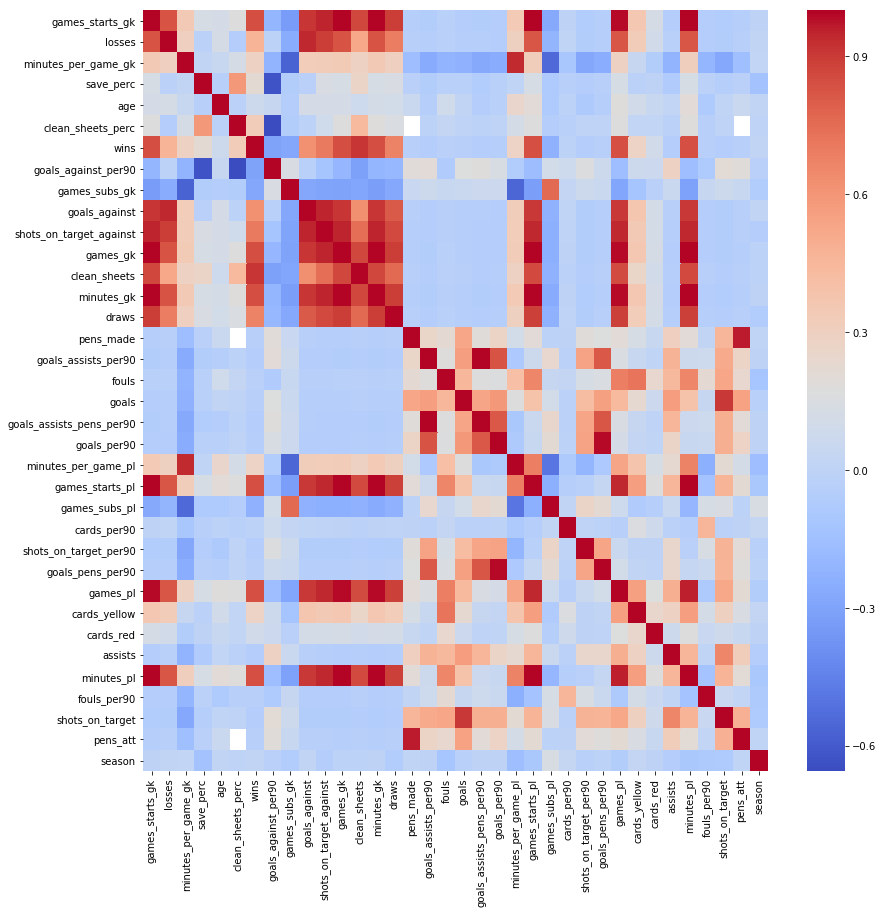

In [116]:
df_both = df_both.drop("Unnamed: 0",axis=1)
plt.figure(figsize=(14,14))
sns_corplot = sns.heatmap((df_both).corr(),cmap='coolwarm')

In [117]:
df_both.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13364 entries, 0 to 514
Data columns (total 40 columns):
games_starts_gk             1128 non-null float64
losses                      1128 non-null float64
minutes_per_game_gk         1128 non-null float64
save_perc                   1123 non-null float64
nationality                 13265 non-null object
player                      13364 non-null object
position                    13340 non-null object
age                         13339 non-null float64
clean_sheets_perc           1087 non-null float64
wins                        1128 non-null float64
goals_against_per90         1128 non-null float64
games_subs_gk               1128 non-null float64
goals_against               1128 non-null float64
shots_on_target_against     1128 non-null float64
games_gk                    1128 non-null float64
clean_sheets                1128 non-null float64
minutes_gk                  1128 non-null float64
draws                       1128 non-null 

In [118]:
fig = sns_corplot.get_figure()
fig.savefig("Correlations_Full_Player.png")

In [119]:
df_both.to_csv("Full_Player.csv")

In [120]:
df_both[df_both['fouls'].notnull()]['season'].nunique()

19

In [121]:
df_both['squad'].unique()

array(['Crystal Palace', 'Norwich City', 'Blackburn Rovers',
       'Southampton', 'Manchester United', 'Wimbledon', 'Manchester City',
       'Arsenal', 'Sheffield Wednesday', 'Leeds United', 'Everton',
       'Nottingham Forest', 'Coventry City', 'Sheffield United',
       'Ipswich Town', 'Liverpool', 'Queens Park Rangers',
       'Tottenham Hotspur', 'Aston Villa', 'Oldham Athletic',
       'Middlesbrough', 'Chelsea', 'West Ham United', 'Swindon Town',
       'Newcastle United', 'Leicester City', 'Bolton Wanderers',
       'Derby County', 'Sunderland', 'Barnsley', 'Charlton Athletic',
       'Watford', 'Bradford City', 'Fulham', 'West Bromwich Albion',
       'Birmingham City', 'Portsmouth', 'Wolverhampton Wanderers',
       'Wigan Athletic', 'Reading', 'Stoke City', 'Hull City', 'Burnley',
       'Blackpool', 'Swansea City', 'Cardiff City', 'Bournemouth',
       'Brighton & Hove Albion', 'Huddersfield Town'], dtype=object)

In [122]:
df_both['Pts'] = df_both['wins'].apply(lambda x:x*3) + df_both['draws']

In [123]:
for year in df_both['season'].unique():
    one_season = df_both[df_both['season'] == year]
    pts_max = 0
    team_win = ''
    for squad in one_season['squad'].unique():
        if one_season[one_season['squad'] == squad]['Pts'].sum() >= pts_max:
            pts_max = one_season[one_season['squad'] == squad]['Pts'].sum()
            team_win = squad
    print(team_win," ",pts_max)

Manchester United   84.0
Manchester United   105.0
Blackburn Rovers   89.0
Manchester United   82.0
Manchester United   75.0
Arsenal   78.0
Manchester United   79.0
Manchester United   91.0
Manchester United   89.0
Arsenal   87.0
Manchester United   83.0
Arsenal   90.0
Chelsea   95.0
Chelsea   91.0
Manchester United   89.0
Manchester United   87.0
Manchester United   90.0
Chelsea   86.0
Manchester United   80.0
Manchester United   89.0
Manchester United   89.0
Manchester City   86.0
Chelsea   87.0
Leicester City   81.0
Chelsea   93.0
Manchester City   100.0


In [124]:
for year in df_both['season'].unique():
    one_season = df_both[df_both['season'] == year]
    Season_wins = one_season['wins'].sum()
    Season_losses = one_season['losses'].sum()
    Season_draws = one_season['draws'].sum()
    gk_starts = one_season['games_starts_gk'].sum()
    print(year,": ",Season_wins," + ",Season_losses," + ",Season_draws," = ",Season_wins+Season_losses+Season_draws, " - ",gk_starts," = ",Season_wins+Season_losses+Season_draws-gk_starts) 


1992 :  332.0  +  333.0  +  262.0  =  927.0  -  924.0  =  3.0
1993 :  323.0  +  312.0  +  284.0  =  919.0  -  922.0  =  -3.0
1994 :  328.0  +  327.0  +  268.0  =  923.0  -  924.0  =  -1.0
1995 :  283.0  +  282.0  +  195.0  =  760.0  -  759.0  =  1.0
1996 :  262.0  +  261.0  +  239.0  =  762.0  -  759.0  =  3.0
1997 :  285.0  +  286.0  +  190.0  =  761.0  -  765.0  =  -4.0
1998 :  264.0  +  265.0  +  228.0  =  757.0  -  756.0  =  1.0
1999 :  288.0  +  283.0  +  189.0  =  760.0  -  761.0  =  -1.0
2000 :  281.0  +  279.0  +  202.0  =  762.0  -  760.0  =  2.0
2001 :  279.0  +  279.0  +  202.0  =  760.0  -  755.0  =  5.0
2002 :  290.0  +  291.0  +  179.0  =  760.0  -  760.0  =  0.0
2003 :  272.0  +  272.0  +  216.0  =  760.0  -  760.0  =  0.0
2004 :  270.0  +  271.0  +  220.0  =  761.0  -  760.0  =  1.0
2005 :  302.0  +  303.0  +  151.0  =  756.0  -  760.0  =  -4.0
2006 :  281.0  +  283.0  +  196.0  =  760.0  -  760.0  =  0.0
2007 :  280.0  +  280.0  +  200.0  =  760.0  -  760.0  =  0.0
200

In [125]:
for year in df_both['season'].unique():
    one_season = df_both[df_both['season'] == year]
    Season_goals = one_season['goals'].sum()
    Season_goals_against = one_season['goals_against'].sum()
    print(year,": ",Season_goals," - ",Season_goals_against," = ",Season_goals-Season_goals_against," %= ",100*(Season_goals-Season_goals_against)/Season_goals) 

1992 :  1140.0  -  1222.0  =  -82.0  %=  -7.192982456140351
1993 :  1140.0  -  1188.0  =  -48.0  %=  -4.2105263157894735
1994 :  1115.0  -  1194.0  =  -79.0  %=  -7.085201793721973
1995 :  970.0  -  988.0  =  -18.0  %=  -1.8556701030927836
1996 :  938.0  -  969.0  =  -31.0  %=  -3.304904051172708
1997 :  978.0  -  1030.0  =  -52.0  %=  -5.316973415132924
1998 :  926.0  -  952.0  =  -26.0  %=  -2.8077753779697625
1999 :  1022.0  -  1057.0  =  -35.0  %=  -3.4246575342465753
2000 :  965.0  -  992.0  =  -27.0  %=  -2.7979274611398965
2001 :  972.0  -  1000.0  =  -28.0  %=  -2.880658436213992
2002 :  970.0  -  1000.0  =  -30.0  %=  -3.0927835051546393
2003 :  984.0  -  1012.0  =  -28.0  %=  -2.845528455284553
2004 :  946.0  -  977.0  =  -31.0  %=  -3.2769556025369977
2005 :  912.0  -  942.0  =  -30.0  %=  -3.289473684210526
2006 :  890.0  -  932.0  =  -42.0  %=  -4.719101123595506
2007 :  951.0  -  1002.0  =  -51.0  %=  -5.3627760252365935
2008 :  876.0  -  905.0  =  -29.0  %=  -3.310502283

In [126]:
df_one_year['shots_on_target'].sum()

3117.0

In [127]:
df_one_year['shots_on_target_against'].sum()

3122.0

In [128]:
df_one_year['goals'].sum()

922.0

In [129]:
df_one_year['goals_against'].sum()

975.0

In [130]:
for year in df_both['season'].unique():
    one_season = df_both[df_both['season'] == year]
    Season_shots = one_season['shots_on_target'].sum()
    Season_shots_against = one_season['shots_on_target_against'].sum()
    print(year,": ",Season_shots," - ",Season_shots_against," = ",Season_shots-Season_shots_against," %= ",100*(Season_shots-Season_shots_against)/Season_shots)
    

1992 :  4242.0  -  4264.0  =  -22.0  %=  -0.5186232909005186
1993 :  4294.0  -  4294.0  =  0.0  %=  0.0
1994 :  4077.0  -  4432.0  =  -355.0  %=  -8.70738287956831
1995 :  3713.0  -  3638.0  =  75.0  %=  2.0199299757608404
1996 :  4135.0  -  3973.0  =  162.0  %=  3.917775090689238
1997 :  4023.0  -  3728.0  =  295.0  %=  7.332836191896595
1998 :  3730.0  -  3849.0  =  -119.0  %=  -3.190348525469169
1999 :  3782.0  -  3752.0  =  30.0  %=  0.7932310946589106
2000 :  3863.0  -  3665.0  =  198.0  %=  5.125550090603158
2001 :  4358.0  -  4286.0  =  72.0  %=  1.6521340064249657
2002 :  3651.0  -  3632.0  =  19.0  %=  0.5204053683922213
2003 :  3602.0  -  3696.0  =  -94.0  %=  -2.6096612992781787
2004 :  4383.0  -  4199.0  =  184.0  %=  4.198037873602555
2005 :  4235.0  -  4091.0  =  144.0  %=  3.4002361275088546
2006 :  3998.0  -  4378.0  =  -380.0  %=  -9.504752376188094
2007 :  3848.0  -  3992.0  =  -144.0  %=  -3.7422037422037424
2008 :  3691.0  -  3549.0  =  142.0  %=  3.8471958818748306

In [131]:
df_both.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13364 entries, 0 to 514
Data columns (total 41 columns):
games_starts_gk             1128 non-null float64
losses                      1128 non-null float64
minutes_per_game_gk         1128 non-null float64
save_perc                   1123 non-null float64
nationality                 13265 non-null object
player                      13364 non-null object
position                    13340 non-null object
age                         13339 non-null float64
clean_sheets_perc           1087 non-null float64
wins                        1128 non-null float64
goals_against_per90         1128 non-null float64
games_subs_gk               1128 non-null float64
goals_against               1128 non-null float64
shots_on_target_against     1128 non-null float64
games_gk                    1128 non-null float64
clean_sheets                1128 non-null float64
minutes_gk                  1128 non-null float64
draws                       1128 non-null 

/anaconda2/lib/python3.6/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/anaconda2/lib/python3.6/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


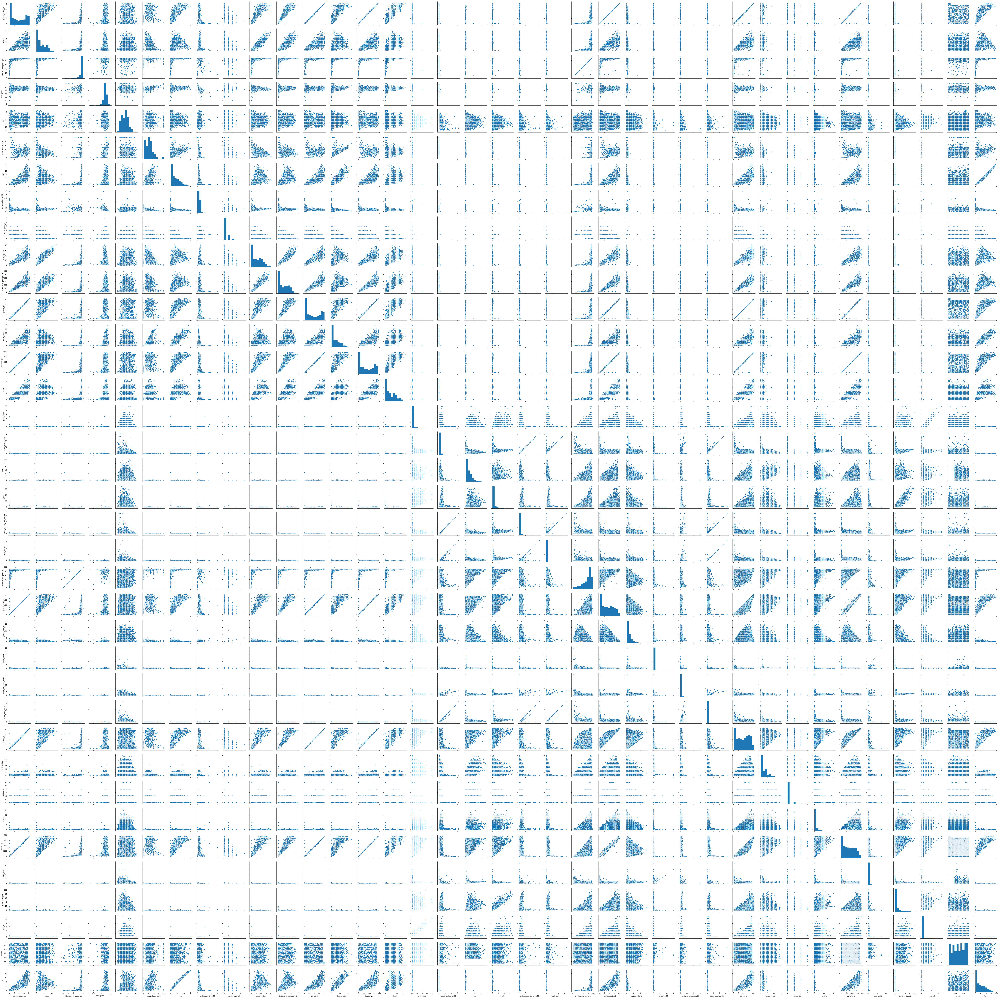

In [132]:
sns.pairplot(df_both)

In [134]:
df_both = df_both.drop('minutes_per_game_gk', axis=1)

In [135]:
df_both = df_both.drop('save_perc', axis=1)

In [136]:
df_both = df_both.drop('clean_sheets_perc', axis=1)

In [137]:
df_both = df_both.drop('goals_against_per90', axis=1)

In [138]:
df_both.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13364 entries, 0 to 514
Data columns (total 37 columns):
games_starts_gk             1128 non-null float64
losses                      1128 non-null float64
nationality                 13265 non-null object
player                      13364 non-null object
position                    13340 non-null object
age                         13339 non-null float64
wins                        1128 non-null float64
games_subs_gk               1128 non-null float64
goals_against               1128 non-null float64
shots_on_target_against     1128 non-null float64
games_gk                    1128 non-null float64
clean_sheets                1128 non-null float64
minutes_gk                  1128 non-null float64
draws                       1128 non-null float64
squad                       13364 non-null object
pens_made                   13305 non-null float64
goals_assists_per90         13320 non-null float64
fouls                       9960 non-nul

In [139]:
df_both = df_both.drop('goals_assists_per90', axis=1)

In [140]:
df_both = df_both.drop('goals_per90', axis=1)

In [141]:
df_both = df_both.drop('minutes_per_game_pl', axis=1)

In [142]:
df_both = df_both.drop('cards_per90', axis=1)

In [143]:
df_both = df_both.drop('shots_on_target_per90', axis=1)

In [144]:
df_both = df_both.drop('goals_pens_per90', axis=1)

In [145]:
df_both.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13364 entries, 0 to 514
Data columns (total 31 columns):
games_starts_gk             1128 non-null float64
losses                      1128 non-null float64
nationality                 13265 non-null object
player                      13364 non-null object
position                    13340 non-null object
age                         13339 non-null float64
wins                        1128 non-null float64
games_subs_gk               1128 non-null float64
goals_against               1128 non-null float64
shots_on_target_against     1128 non-null float64
games_gk                    1128 non-null float64
clean_sheets                1128 non-null float64
minutes_gk                  1128 non-null float64
draws                       1128 non-null float64
squad                       13364 non-null object
pens_made                   13305 non-null float64
fouls                       9960 non-null float64
goals                       13348 non-nul

In [146]:
df_both = df_both.drop('goals_assists_pens_per90', axis=1)

In [147]:
df_both = df_both.drop('fouls_per90', axis=1)

In [148]:
df_both = df_both.drop('Pts', axis=1)

In [149]:
df_both.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13364 entries, 0 to 514
Data columns (total 28 columns):
games_starts_gk            1128 non-null float64
losses                     1128 non-null float64
nationality                13265 non-null object
player                     13364 non-null object
position                   13340 non-null object
age                        13339 non-null float64
wins                       1128 non-null float64
games_subs_gk              1128 non-null float64
goals_against              1128 non-null float64
shots_on_target_against    1128 non-null float64
games_gk                   1128 non-null float64
clean_sheets               1128 non-null float64
minutes_gk                 1128 non-null float64
draws                      1128 non-null float64
squad                      13364 non-null object
pens_made                  13305 non-null float64
fouls                      9960 non-null float64
goals                      13348 non-null float64
games_st

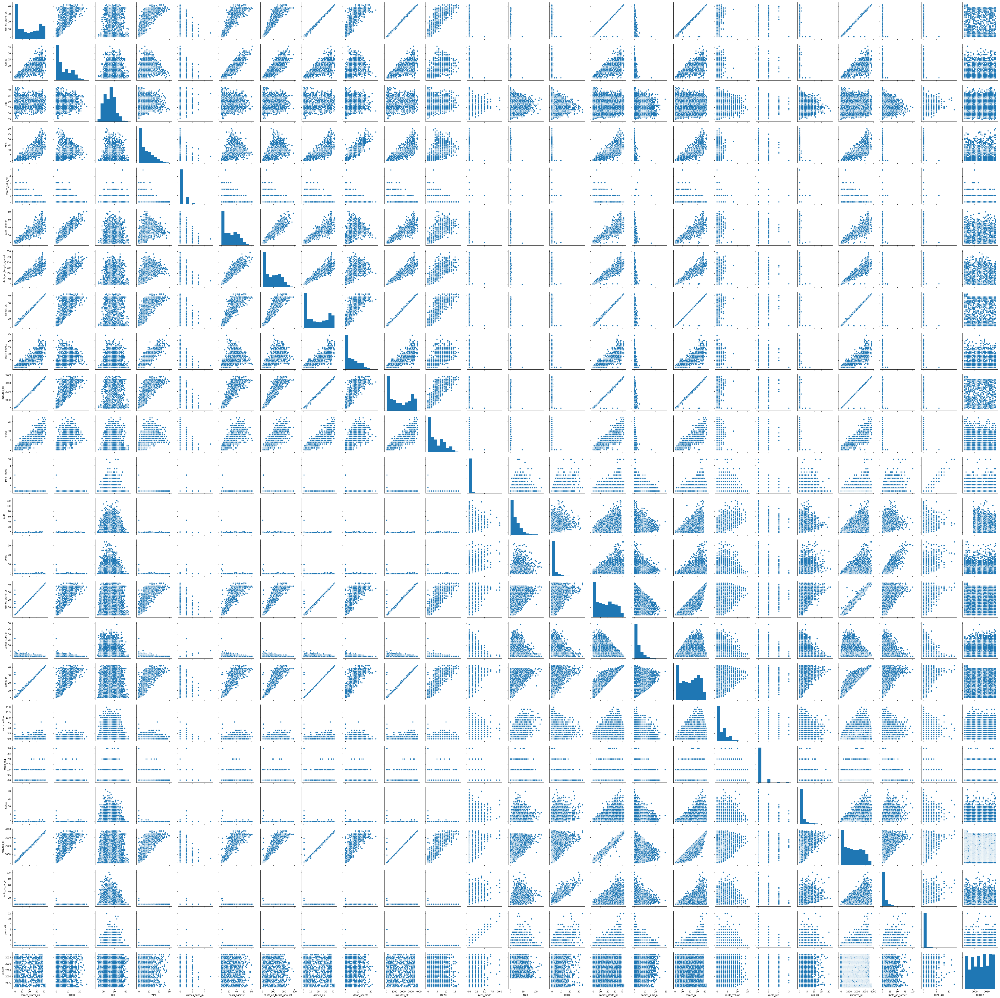

In [150]:
sns.pairplot(df_both)

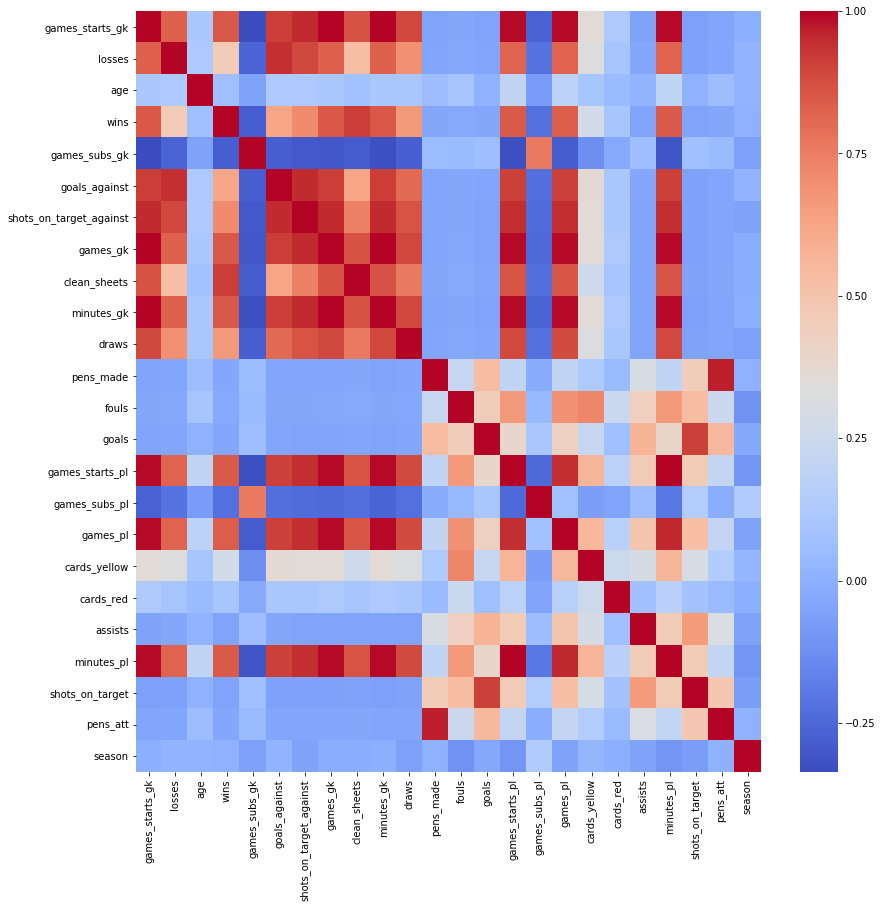

In [151]:
plt.figure(figsize=(14,14))
sns_corplot = sns.heatmap((df_both).corr(),cmap='coolwarm')

In [152]:
fig = sns_corplot.get_figure()
fig.savefig("Correlations_Slim_Player.png")

In [153]:
df_both.to_csv("Slim_Player.csv")

In [158]:
df_both['nationality'].nunique()

132

In [159]:
df_both['nationality'].unique()

array(['eng', 'sco', 'dk', 'nl', 'wal', 'ie', nan, 'no', 'au', 'cs,cz',
       'ca', 'ru,su', 'zw', 'nir', 'jm', 'ms', 'se', 'tt', 'us', 'bg',
       'es', 'pl', 'is', 'il', 'fr', 'kn', 'mt', 'de', 'ng', 'lc', 'hu',
       'cz', 'my', 'za', 'cy', 'ch', 'ro', 'be', 'gh', 'uy', 'nz', 'zm',
       'ge', 'rs', 'br', 'hr', 'fi', 'co', 'it', 'pt', 'bo', 'bb', 'ee',
       'tr', 'hr,yu', 'gr', 'cs,sk', 'cr', 'at', 'gy', 'mk', 'si', 'lr',
       'dz', 'bm', 'ar', 'pe', 'ma', 'ci', 'cm', 'lv', 'gn', 'ba', 'cl',
       'de,za', 'su,ua', 'cd', 'ml', 'py', 'gi', 'ua', 'sk', 'yu',
       'cg,fr', 'hn', 'lt', 'ir', 'fr,sn', 'ec', 'sc', 'gd', 'cn', 'sn',
       'fr,pl', 'gp', 'jp', 'ru', 'tg', 'pk', 'tn', 'ag', 'eg', 'fr,gp',
       'kr', 'by', 'mx', 'cg', 'sl', 'om', 'mq', 'ga', 'ao', 'cw', 'cv',
       'fo', 'al', 'fr,mq', 'td', 'bj', 'me', 'bi', 've', 'ke', 'gw',
       'ar,es', 'gm', 'bf', 'am', 'ch,pt', 'co,es', 'ar,it', 'gq',
       'de,tr'], dtype=object)

In [160]:
df_both['position'].nunique()

18

In [164]:
df_both['position'].value_counts()

DF          3750
MF          3420
FW          2273
GK          1128
FW,MF        742
DF,MF        686
MF,FW        606
MF,DF        525
MF,DF,FW      51
FW,DF         48
FW,MF,DF      44
DF,FW         34
DF,FW,MF      13
GK,DF          9
DF,GK          5
GK,FW          3
FW,GK          2
GK,MF          1
Name: position, dtype: int64

In [192]:
df_FW = df_both[df_both['position'].apply(lambda x: "FW" in str(x))]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a9f4a68d0>,
      dtype=object)

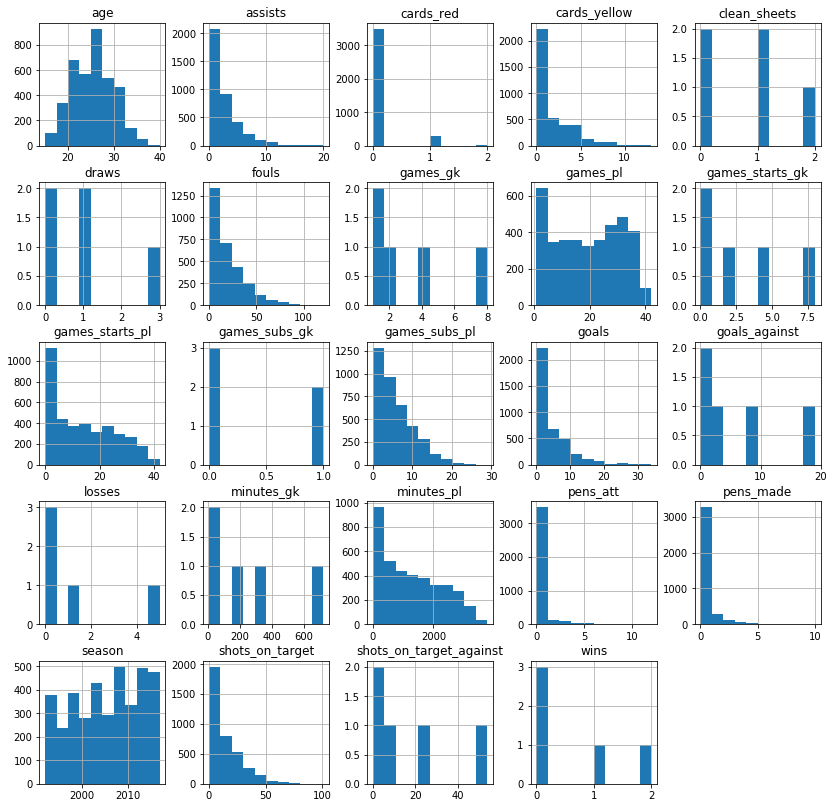

In [193]:
df_FW.hist(figsize=(14,14))

In [194]:
df_FW['position'].unique()

array(['FW', 'FW,MF', 'MF,FW', 'MF,DF,FW', 'DF,FW', 'FW,DF', 'FW,MF,DF',
       'DF,FW,MF', 'GK,FW', 'FW,GK'], dtype=object)

In [197]:
df_MF = df_both[df_both['position'].apply(lambda x: "MF" in str(x))]

In [198]:
df_MF['position'].unique()

array(['MF', 'DF,MF', 'FW,MF', 'MF,DF', 'MF,FW', 'MF,DF,FW', 'FW,MF,DF',
       'DF,FW,MF', 'GK,MF'], dtype=object)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1aa1936978>,
      dtype=object)

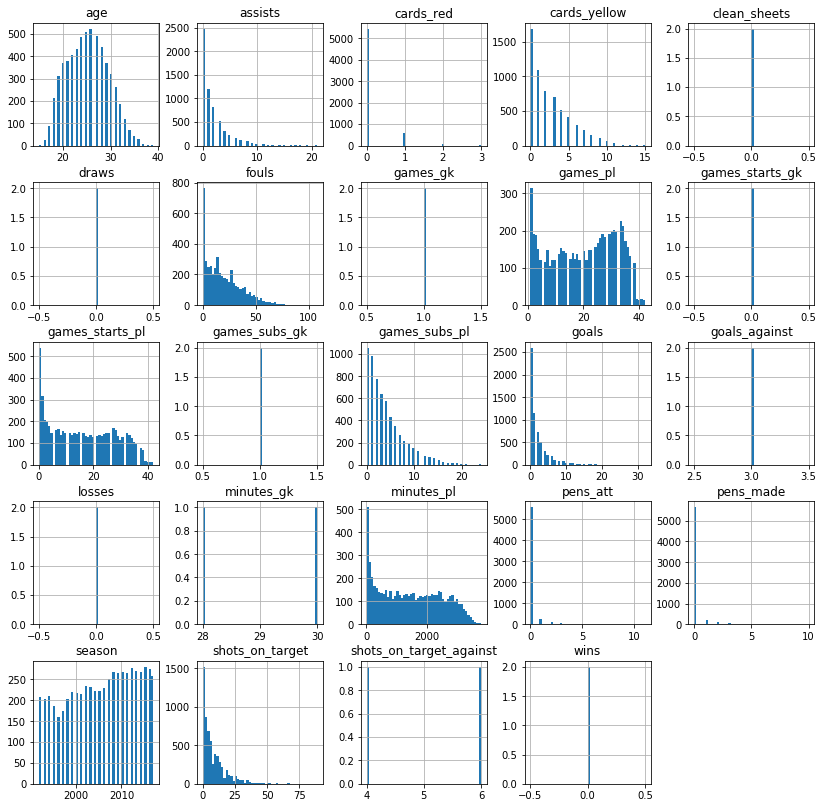

In [202]:
df_MF.hist(figsize=(14,14),bins=50)